In [24]:
import numpy as np
from matplotlib import pyplot as plt
from PIL import Image
from matplotlib.colors import hsv_to_rgb

In [25]:
def hist_match(source, template):
    """
    Adjust the pixel values of a grayscale image such that its histogram
    matches that of a target image

    Arguments:
    -----------
        source: np.ndarray
            Image to transform; the histogram is computed over the flattened
            array
        template: np.ndarray
            Template image; can have different dimensions to source
    Returns:
    -----------
        matched: np.ndarray
            The transformed output image
    """

    oldshape = source.shape
    source = source.ravel()
    template = template.ravel()

    # get the set of unique pixel values and their corresponding indices and
    # counts
    s_values, bin_idx, s_counts = np.unique(source, return_inverse=True,
                                            return_counts=True)
    t_values, t_counts = np.unique(template, return_counts=True)

    # take the cumsum of the counts and normalize by the number of pixels to
    # get the empirical cumulative distribution functions for the source and
    # template images (maps pixel value --> quantile)
    s_quantiles = np.cumsum(s_counts).astype(np.float64)
    s_quantiles /= s_quantiles[-1]
    t_quantiles = np.cumsum(t_counts).astype(np.float64)
    t_quantiles /= t_quantiles[-1]

    # interpolate linearly to find the pixel values in the template image
    # that correspond most closely to the quantiles in the source image
    interp_t_values = np.interp(s_quantiles, t_quantiles, t_values)

    return interp_t_values[bin_idx].reshape(oldshape)

In [27]:
sourcename="img/20190221.2/20190221171414.jpg"
source = Image.open( sourcename )
sourcedata = np.asarray( source, dtype="int32" )
sourceHSV = source.convert('HSV')
sourceHSVdata = np.asarray( sourceHSV, dtype="int32" )/255

templatename="img/20190221.2/20190221171409.jpg"
template = Image.open( templatename )
templatedata = np.asarray( template, dtype="int32")
templateHSV = template.convert('HSV')
templateHSVdata = np.asarray( templateHSV, dtype="int32" )/255

newimageHSVdata = sourceHSVdata
newimageHSVdata[:,:,2] = hist_match(sourceHSVdata[:,:,2], templateHSVdata[:,:,2])
newimageRGBdata = hsv_to_rgb(newimageHSVdata)*255
newimage = Image.fromarray(newimageRGBdata.astype('uint8'))


(array([0.00000e+00, 0.00000e+00, 1.00000e+00, 3.77000e+02, 1.66790e+04,
        9.76920e+04, 1.48005e+05, 1.80547e+05, 1.40586e+05, 1.12306e+05,
        8.91140e+04, 9.18790e+04, 8.10280e+04, 9.34840e+04, 1.09426e+05,
        9.24980e+04, 9.30960e+04, 6.68280e+04, 4.38180e+04, 2.09470e+04,
        1.74190e+04, 1.71290e+04, 1.88560e+04, 2.22660e+04, 1.97020e+04,
        2.55650e+04, 2.05120e+04, 2.34120e+04, 2.47050e+04, 1.90200e+04,
        1.96630e+04, 1.42790e+04, 1.91390e+04, 2.21900e+04, 1.66460e+04,
        1.87130e+04, 1.40700e+04, 7.17600e+03, 8.53400e+03, 1.42360e+04,
        2.54120e+04, 2.76480e+04, 1.74540e+04, 3.15830e+04, 4.78010e+04,
        9.26860e+04, 1.67789e+05, 4.91330e+05, 3.09810e+05]),
 array([0.        , 0.02040816, 0.04081633, 0.06122449, 0.08163265,
        0.10204082, 0.12244898, 0.14285714, 0.16326531, 0.18367347,
        0.20408163, 0.2244898 , 0.24489796, 0.26530612, 0.28571429,
        0.30612245, 0.32653061, 0.34693878, 0.36734694, 0.3877551 ,
        0

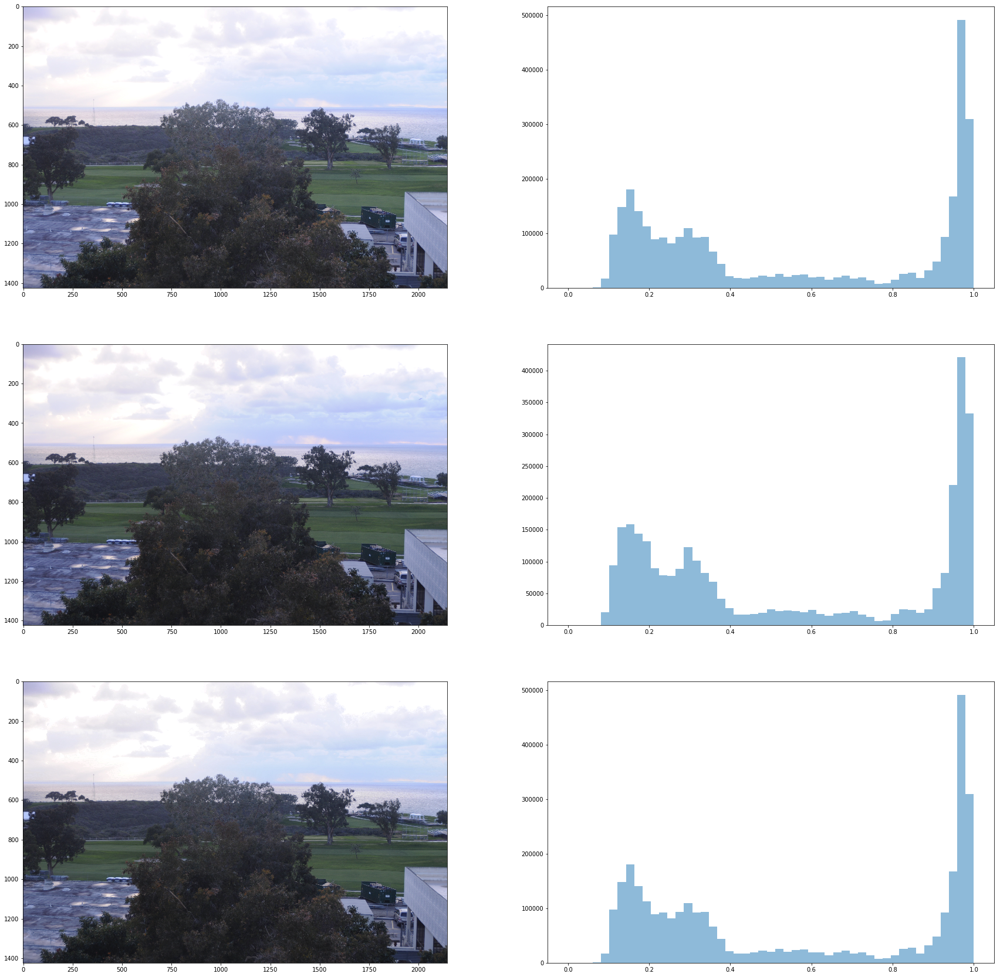

In [28]:
fig, axs = plt.subplots(3, 2, sharey=False,figsize=(30, 30),)
bins = np.linspace(0,1,50)

axs[0,0].imshow(source)
axs[0,1].hist(sourceHSVdata[:,:,2].ravel(),bins,alpha=0.5, label='s',)

axs[1,0].imshow(template)
axs[1,1].hist(templateHSVdata[:,:,2].ravel(),bins,alpha=0.5, label='t')

axs[2,0].imshow(newimage)
axs[2,1].hist(newimageHSVdata[:,:,2].ravel(),bins,alpha=0.5, label='t')


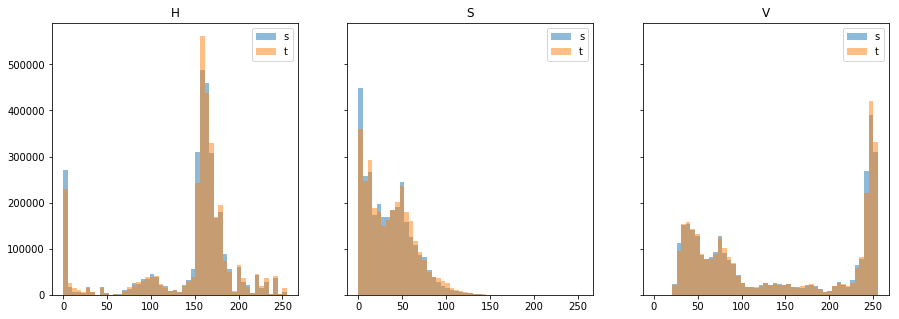

In [101]:
axs[1,0].imshow(template)
bins = np.linspace(0,255,50)

fig, axs = plt.subplots(1, 3, sharey=True,figsize=(15, 5),)


axs[0].hist(sourcedata[:,:,0].ravel(),bins,alpha=0.5, label='s')
axs[0].hist(templatedata[:,:,0].ravel(),bins,alpha=0.5, label='t')
axs[0].set_title('H')
axs[0].legend()

axs[1].hist(sourcedata[:,:,1].ravel(),bins,alpha=0.5, label='s')
axs[1].hist(templatedata[:,:,1].ravel(),bins,alpha=0.5, label='t')
axs[1].set_title('S')
axs[1].legend()

axs[2].hist(sourcedata[:,:,2].ravel(),bins,alpha=0.5, label='s')
axs[2].hist(templatedata[:,:,2].ravel(),bins,alpha=0.5, label='t')
axs[2].set_title('V')
axs[2].legend()



In [100]:
matchedvector = hist_match(sourcedata[:,:,2], templatedata[:,:,2])
matcheddata=sourcedata
matcheddata[:,:,2] = matchedvector


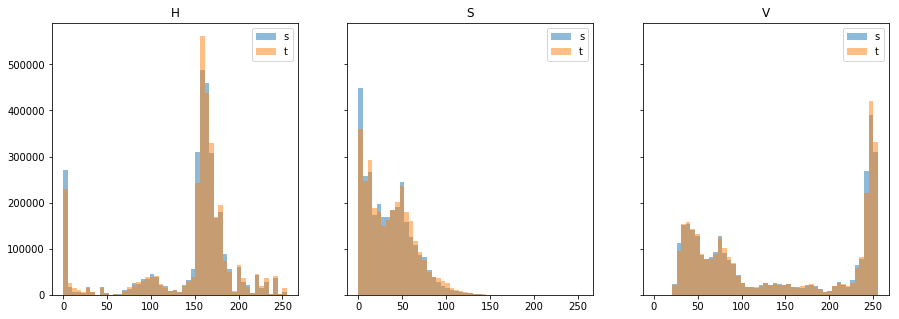

In [95]:
fig, axs = plt.subplots(1, 3, sharey=True,figsize=(15, 5),)


axs[0].hist(sourcedata[:,:,0].ravel(),bins,alpha=0.5, label='s')
axs[0].hist(templatedata[:,:,0].ravel(),bins,alpha=0.5, label='t')
axs[0].set_title('H')
axs[0].legend()

axs[1].hist(sourcedata[:,:,1].ravel(),bins,alpha=0.5, label='s')
axs[1].hist(templatedata[:,:,1].ravel(),bins,alpha=0.5, label='t')
axs[1].set_title('S')
axs[1].legend()


axs[2].hist(sourcedata[:,:,2].ravel(),bins,alpha=0.5, label='s')
axs[2].hist(templatedata[:,:,2].ravel(),bins,alpha=0.5, label='t')
#axs[2].hist(matcheddata[:,:,2].ravel(),bins,alpha=0.5,label='m')
axs[2].set_title('V')
axs[2].legend()


In [110]:
matcheddata=sourcedata
matcheddata[:,:,2] = matchedvector
matcheddata.mean()

107.37123928723658

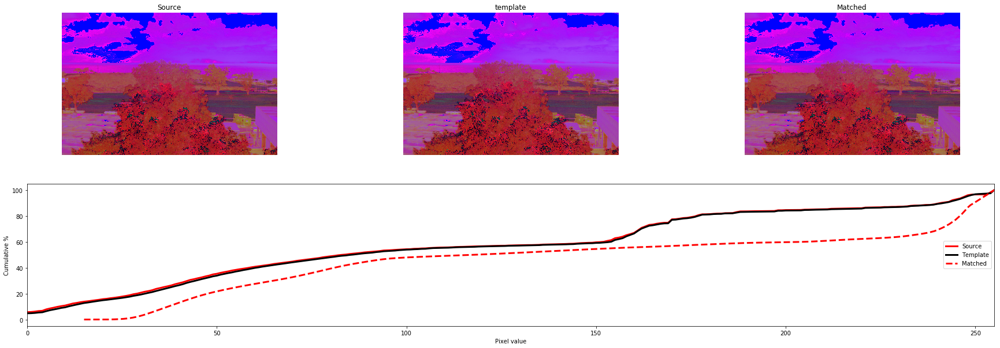

In [84]:
def ecdf(x):
    """convenience function for computing the empirical CDF"""
    vals, counts = np.unique(x, return_counts=True)
    ecdf = np.cumsum(counts).astype(np.float64)
    ecdf /= ecdf[-1]
    return vals, ecdf

x1, y1 = ecdf(sourcedata.ravel())
x2, y2 = ecdf(templatedata.ravel())
x3, y3 = ecdf(matched.ravel())

fig = plt.figure(figsize=(30,10))
gs = plt.GridSpec(2, 3)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1], sharex=ax1, sharey=ax1)
ax3 = fig.add_subplot(gs[0, 2], sharex=ax1, sharey=ax1)
ax4 = fig.add_subplot(gs[1, :])
for aa in (ax1, ax2, ax3):
    aa.set_axis_off()

ax1.imshow(sourcedata, cmap=plt.cm.gray)
ax1.set_title('Source')
ax2.imshow(templatedata, cmap=plt.cm.gray)
ax2.set_title('template')
ax3.imshow(matcheddata, cmap=plt.cm.gray)
ax3.set_title('Matched')

ax4.plot(x1, y1 * 100, '-r', lw=3, label='Source')
ax4.plot(x2, y2 * 100, '-k', lw=3, label='Template')
ax4.plot(x3, y3 * 100, '--r', lw=3, label='Matched')
ax4.set_xlim(x1[0], x1[-1])
ax4.set_xlabel('Pixel value')
ax4.set_ylabel('Cumulative %')
ax4.legend(loc=5)

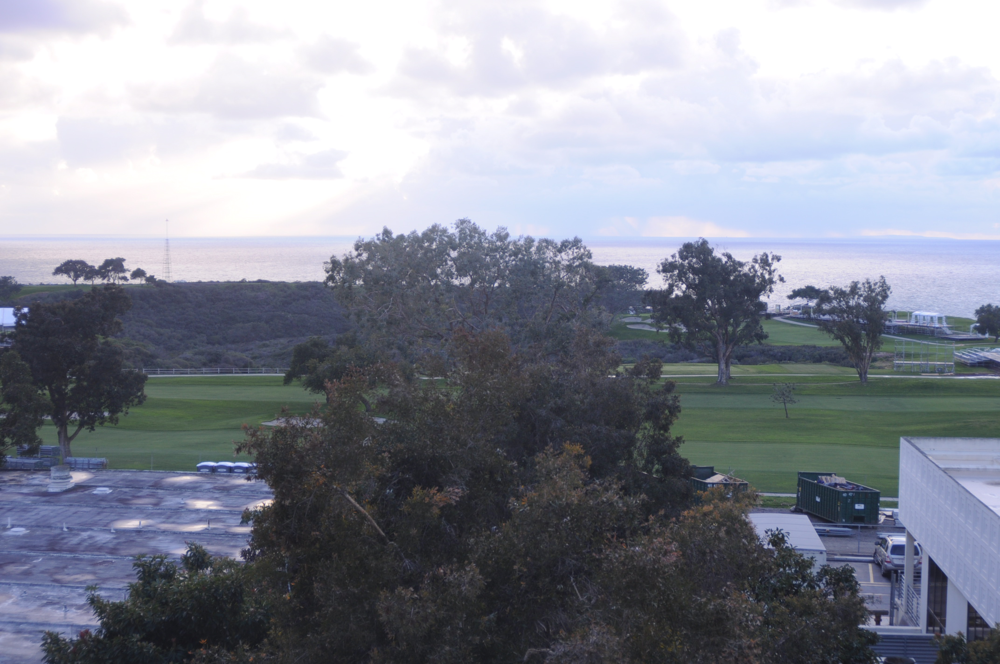

[0.74117647 0.74901961 0.89803922]
[0.65490196 0.17254902 0.89803922]
[ 94.74313725  96.13773933 114.5       ]


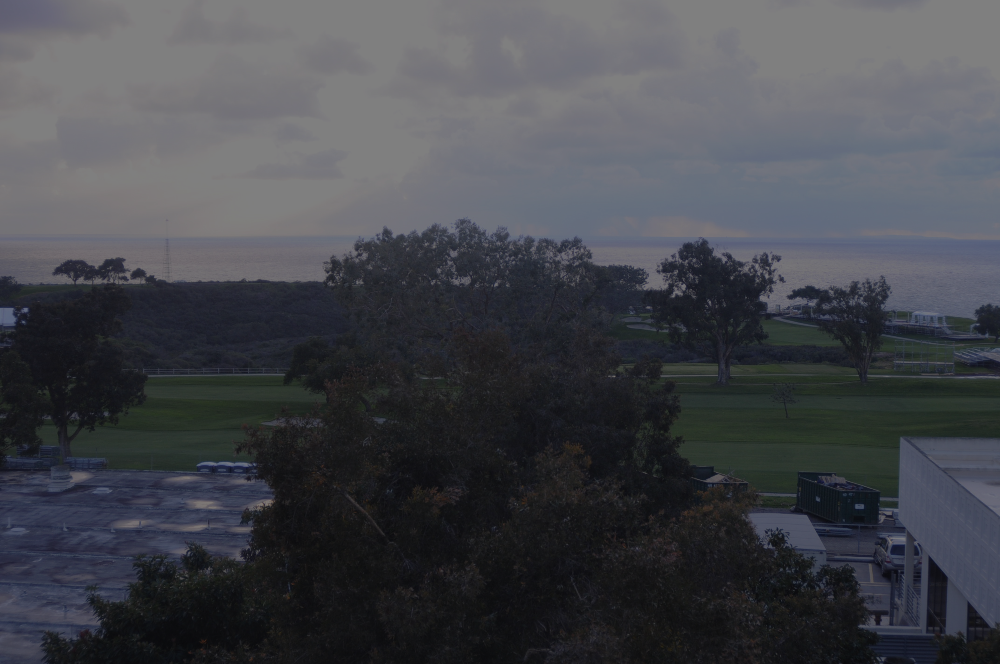

In [3]:
from matplotlib.colors import hsv_to_rgb


sourcename="img/20190221.2/20190221171414.jpg"
source = Image.open( sourcename )
display(source)
print(np.asarray(source,dtype="int32")[0,0,:]/255)
sourceHSV = source.convert('HSV')
sourceHSVdata = np.asarray( sourceHSV, dtype="int32" )/255
print(sourceHSVdata[0,0,:])
sourceHSVdata[:,:,2] = sourceHSVdata[:,:,2]/2
sourceRGBdata = hsv_to_rgb(sourceHSVdata)*255
print(sourceRGBdata[0,0,:])
source2 = Image.fromarray(sourceRGBdata.astype('uint8'))
display(source2)
#plt.imshow(sourcedata)

#plt.imshow(np.asarray(source2,dtype="int32"))